# Contenido (hipervínculos)

1. <a href="L2D"> Modelo </a>

2. <a href="#caso1" >Caso 1: Cilindro sumergido</a>

3. <a href="#caso2" > Caso 2: Isla cónica (NOAA)></a>

4. <a href="#caso3" > Caso 3: Chile 2010 (Moreno)></a>

<a id="L2D"> </a>
 # COMCOT  lineal 2D sin borde móvil


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
%matplotlib inline

In [258]:
def simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx):
    dp1 = np.zeros_like(x)
    dp2 = np.zeros_like(x)
    dq1 = np.zeros_like(x)
    dq2 = np.zeros_like(x)

    zdepth = np.zeros_like(eta)
    zdepth[0,:,:] = eta[0,:,:]+h

    t0 = time.clock()
    for n in range(nt-1):


        ## Mas Loop
        for i in range(1, nx-1):
            for j in range(1, ny-1):
                if (h[i,j]>gx):
                    zzz = eta[n,i,j] - rx*(p[n,i,j]-p[n,i-1,j]) \
                                   - ry*(q[n,i,j]-q[n,i,j-1])
                    DD = zzz + h[i,j]
                    zdepth[n+1,i,j] = DD
                    eta[n+1,i,j] = zzz    
                else:
                    eta[n+1,i,j] = 0.0
        # open boundary
        # los bordes se pueden ignorar????....
        i = 0
        for j in range(1,ny-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                if h[i,j-1]>gx:
                    uh = 0.5*(q[n,i,j]+q[n,i,j-1])
                else:
                    uh = q[n,i,j]
                uu = np.sqrt(uh**2+p[n,i,j]**2)
                zz = uu/cc
                if p[n,i,j]>0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]

        i = nx-1
        for j in range(1,ny-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i,j-1])
                uu = np.sqrt(uh**2+p[n,i-1,j]**2)
                zz = uu/cc
                if p[n,i-1,j]<0:
                    zz = -zz
                eta[n+1,i,j] = zz     
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]

        j = 0
        for i in range(1,nx-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i-1,j])
                uu = np.sqrt(uh**2+q[n,i,j]**2)
                zz = uu/cc
                if q[n,i,j]>0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]        

        j = ny-1
        for i in range(1,nx-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i-1,j])
                uu = np.sqrt(uh**2+q[n,i,j]**2)
                zz = uu/cc
                if q[n,i-1,j]<0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j] 

        i = 0
        j = 0
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i,j]
            qy = q[n,i,j]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx>0 or qy>0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]           

        i = nx-1
        j = 0
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i-1,j]
            qy = q[n,i,j]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx<0 or qy>0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]                 

        i = 0
        j = ny-1
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i,j]
            qy = q[n,i,j-1]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx>0 or qy<0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]

        i = nx-1
        j = ny-1
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i-1,j]
            qy = q[n,i,j-1]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx<0 or qy<0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]               

        # momentum loop

        # momentum in x-direction
        for i in range(0,nx-1):
            for j in range(0,ny-1):
                ip1 = min(nx-1,i+1)
                jp1 = max(0,i-1)
                
                if h[i,j]>gx and h[ip1,j]>gx:
                    hM = 0.5*(h[i,j]+h[ip1,j]) + 0.5 *(eta[n+1,i,j]+eta[n+1,ip1,j])
                    p[n+1,i,j]  = p[n,i,j] - 9.81 * rx*hM * (eta[n+1,ip1,j]-eta[n+1,i,j])
                else:
                    p[n+1,i,j] = 0.0

        # momentum in y-direction
        for i in range(0,nx-1):
            for j in range(0,ny-1):
                ip1 = min(nx-1,i+1)
                jp1 = min(ny-1,j+1)
                
                if h[i,j]>gx and h[i,jp1]>gx:
                    hN = 0.5*(h[i,j]+h[i,jp1]) + 0.5 *(eta[n+1,i,j]+eta[n+1,i,jp1])
                    q[n+1,i,j]  = q[n,i,j] - 9.81 *ry* hN * (eta[n+1,i,jp1]-eta[n+1,i,j])
                else:
                    q[n+1,i,j] = 0.0  
    
        t1 = time.clock()    
        print n*1.0/nt, 'elapsed: %.3f s, estimated %.3f s:'%(t1-t0,(t1-t0)*nt*1.0/(n+1))
    return eta,p,q

* Revisar condiciones de borde

<a id="caso1"></a>
# Caso de prueba #1: 
# Campana gaussiana sobre cilindro sumergido

In [33]:
nt = 300
ny = 100
nx = 100
y = np.linspace(-200,200,ny)
x = np.linspace(-200,200,nx)
x,y = np.meshgrid(x,y,indexing='ij')
h = np.ones_like(x)*5.
h = np.where(np.abs(x**2+y**2)<=50**2,1.0,h)
# h = np.where(x>=90,-2,h)
# h = np.where(y<=-90,-2,h)
# h = np.where(y>=90,-2,h)

## Batimetría

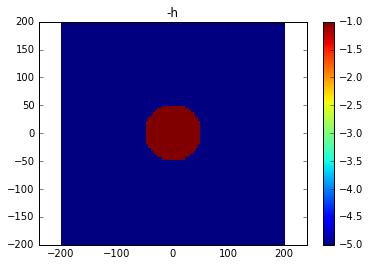

In [34]:
plt.pcolormesh(x,y,-h)
plt.axis('equal')
plt.title('-h')
plt.colorbar()

## Condición inicial (sup libre)

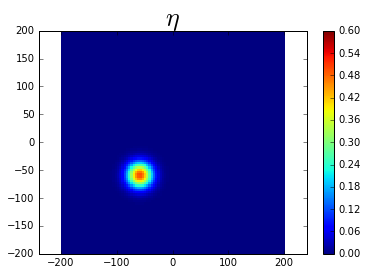

In [5]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = 00.5*np.exp(-((y+60)**2+(x+60)**2)/500) ##gaussian bell
eta[0,:,:] = np.where(h>=0,eta[0,:,:],-h)
plt.pcolormesh(x,y,eta[0,:,:],vmax=0.6)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()

In [6]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))

In [7]:
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-5
grx = 9.81*dt/dx
gry = 9.81*dt/dy

## Simulación

In [9]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)

0.0 elapsed: 0.119 s, estimated 35.661 s:
0.00333333333333 elapsed: 0.219 s, estimated 32.805 s:
0.00666666666667 elapsed: 0.335 s, estimated 33.498 s:
0.01 elapsed: 0.453 s, estimated 33.990 s:
0.0133333333333 elapsed: 0.570 s, estimated 34.217 s:
0.0166666666667 elapsed: 0.680 s, estimated 34.005 s:
0.02 elapsed: 0.797 s, estimated 34.144 s:
0.0233333333333 elapsed: 0.905 s, estimated 33.931 s:
0.0266666666667 elapsed: 1.013 s, estimated 33.754 s:
0.03 elapsed: 1.130 s, estimated 33.909 s:
0.0333333333333 elapsed: 1.251 s, estimated 34.108 s:
0.0366666666667 elapsed: 1.479 s, estimated 36.973 s:
0.04 elapsed: 1.623 s, estimated 37.459 s:
0.0433333333333 elapsed: 1.755 s, estimated 37.607 s:
0.0466666666667 elapsed: 1.878 s, estimated 37.558 s:
0.05 elapsed: 1.985 s, estimated 37.221 s:
0.0533333333333 elapsed: 2.137 s, estimated 37.711 s:
0.0566666666667 elapsed: 2.314 s, estimated 38.568 s:
0.06 elapsed: 2.422 s, estimated 38.238 s:
0.0633333333333 elapsed: 2.537 s, estimated 38.059

## Animación

Se ve bien la refracción, excepto por la condición de borde.


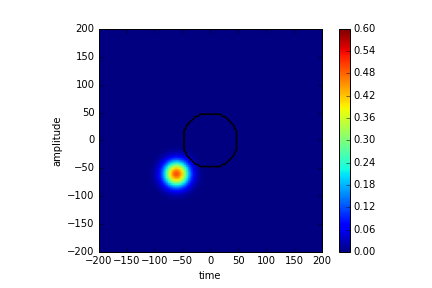
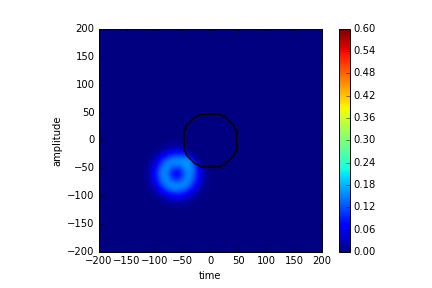
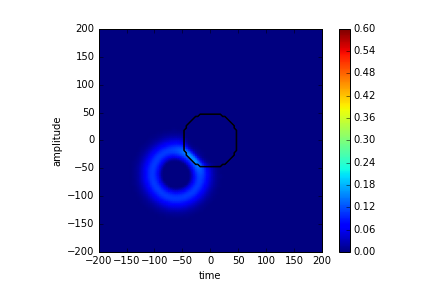
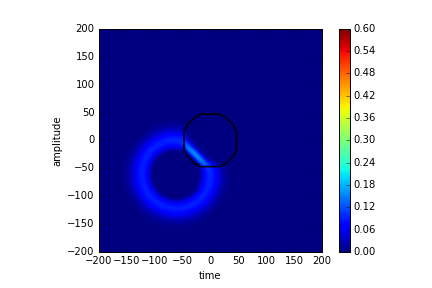
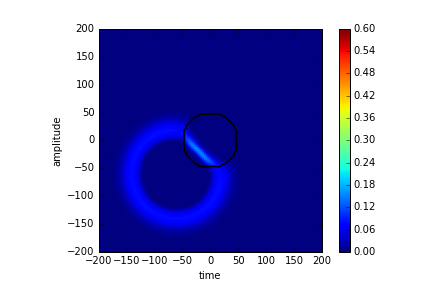
...
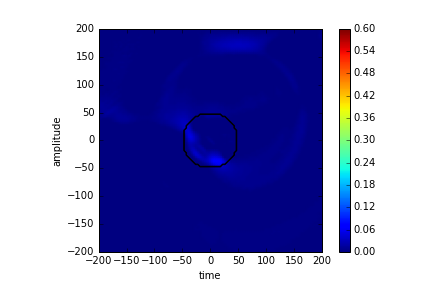
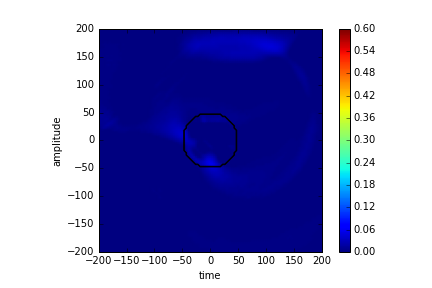
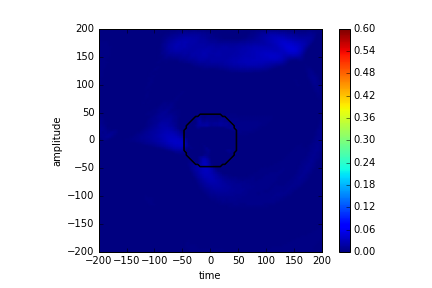
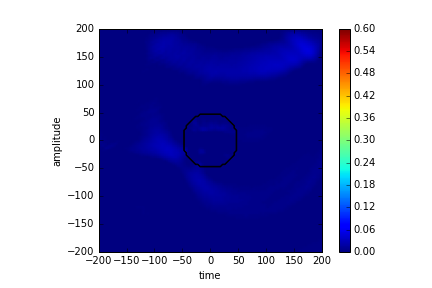
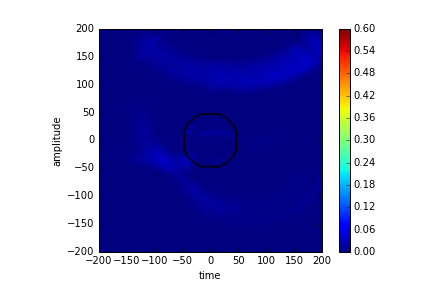

In [13]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmax=0.6)
ax2.contour(x,y,h,[2.0, 1.0],colors='k')
ax2.contour(x,y,h,[0.0],colors='w')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[min(i*10,299),:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=30, interval=100)

<a id="caso2"></a>

# [Caso 2: Isla cónica (NOAA)](http://nctr.pmel.noaa.gov/benchmark/Laboratory/Laboratory_ConicalIsland/index.html)

In [45]:
def topo(x,y):
    """
    Conical island
    """
    # Depth of water: 0.32 or 0.42 meters for benchmarks.
    depth = 0.32
    r = np.sqrt(x**2 + y**2) 
    z = np.where(r < 1.1, 0.625, 0.625 - 0.25*(r-1.1))
    z = np.where(r < 3.6, z, 0.)
    z = z - depth
    return z

In [46]:
def qinit(x,y):
    """
    Wave approaching from left.
    (Used as initial test problem)
    """
    hjump = 0.3
#     z = np.where((x > -9.) & (x < -7.), hjump, 0.)
    z = 0.01*np.exp(-(x+8)**2)
    return z

In [63]:
nt = 250
ny = 100
nx = 125
y = np.linspace(-15,15,ny)
x = np.linspace(-22.5,15,nx)
x,y = np.meshgrid(x,y,indexing='ij')
h = -topo(x,y)

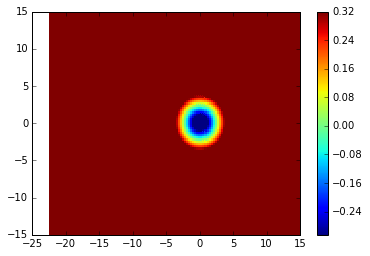

In [64]:
plt.pcolormesh(x,y,h)
plt.colorbar()

In [65]:
5/4000.

0.00125

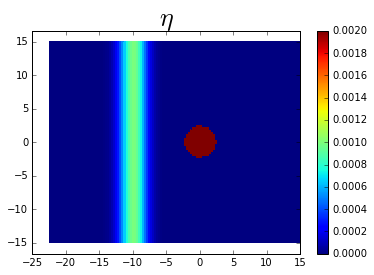

In [66]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = 0.001*np.exp(-(x+10)**2/4) ##gaussian bell
eta[0,:,:] = np.where(h>=0,eta[0,:,:],-h)
plt.pcolormesh(x,y,eta[0,:,:],vmax=0.002)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()

In [67]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-5
grx = 9.81*dt/dx
gry = 9.81*dt/dy

In [68]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)
print 'finished!'

0.0 elapsed: 0.263 s, estimated 65.675 s:
0.004 elapsed: 0.502 s, estimated 62.747 s:
0.008 elapsed: 0.755 s, estimated 62.932 s:
0.012 elapsed: 0.999 s, estimated 62.452 s:
0.016 elapsed: 1.150 s, estimated 57.481 s:
0.02 elapsed: 1.296 s, estimated 54.003 s:
0.024 elapsed: 1.429 s, estimated 51.019 s:
0.028 elapsed: 1.576 s, estimated 49.264 s:
0.032 elapsed: 1.727 s, estimated 47.977 s:
0.036 elapsed: 1.872 s, estimated 46.808 s:
0.04 elapsed: 2.011 s, estimated 45.696 s:
0.044 elapsed: 2.154 s, estimated 44.867 s:
0.048 elapsed: 2.298 s, estimated 44.188 s:
0.052 elapsed: 2.444 s, estimated 43.638 s:
0.056 elapsed: 2.590 s, estimated 43.165 s:
0.06 elapsed: 2.726 s, estimated 42.600 s:
0.064 elapsed: 2.869 s, estimated 42.197 s:
0.068 elapsed: 3.010 s, estimated 41.806 s:
0.072 elapsed: 3.188 s, estimated 41.942 s:
0.076 elapsed: 3.334 s, estimated 41.678 s:
0.08 elapsed: 3.466 s, estimated 41.266 s:
0.084 elapsed: 3.607 s, estimated 40.991 s:
0.088 elapsed: 3.746 s, estimated 40.7

In [71]:
np.mean(h)

0.30963787324695613


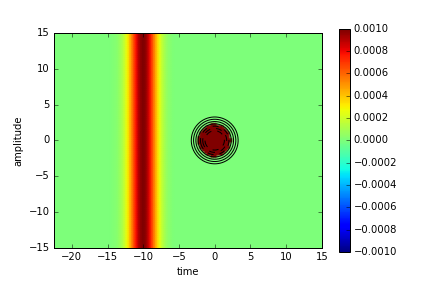
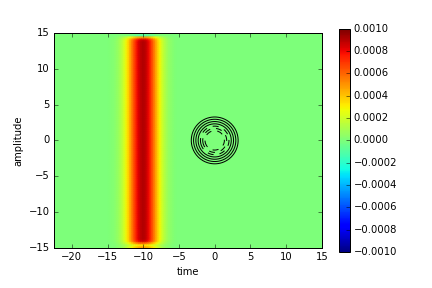
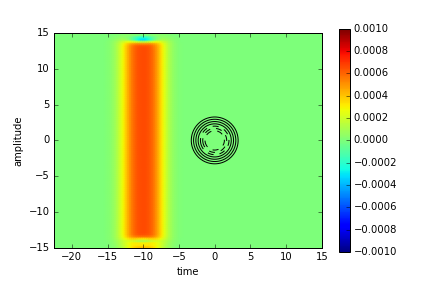
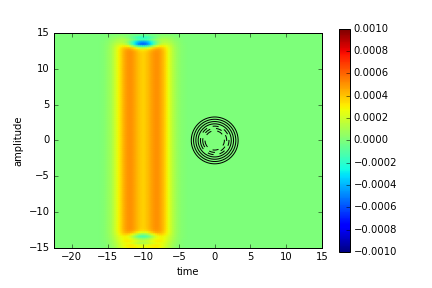
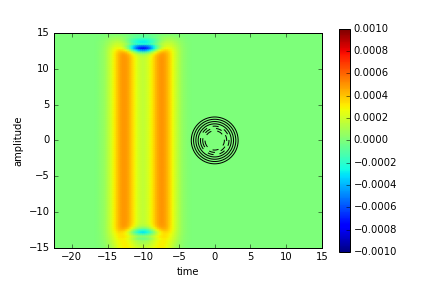
...
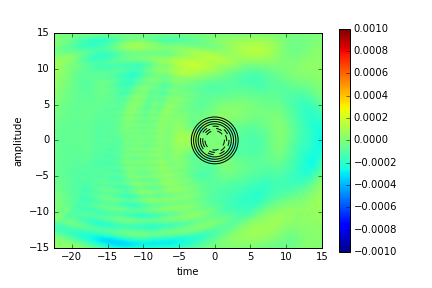
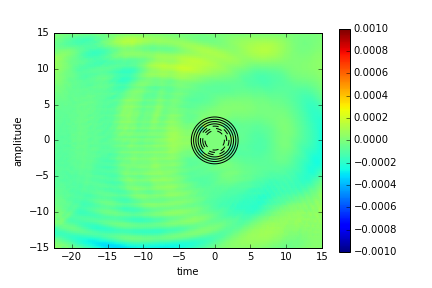
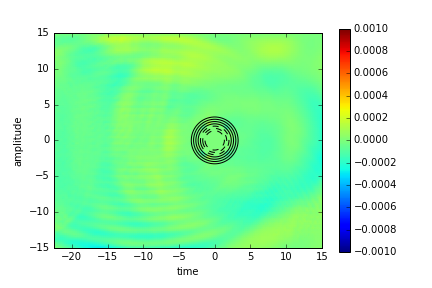
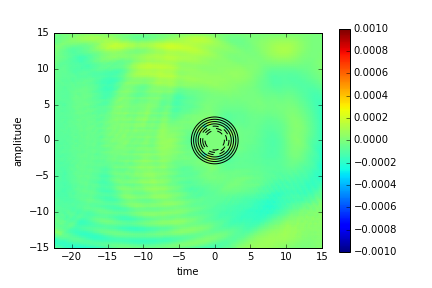
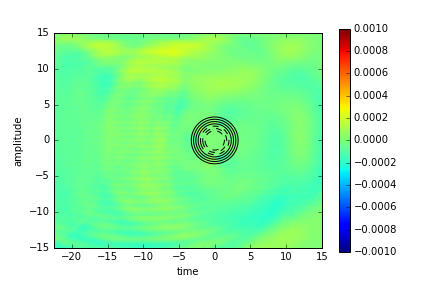

In [73]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmin=-0.001,vmax=0.001)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
# ax2.set_xlim(-10,5)
# ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*5,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=50, interval=100)


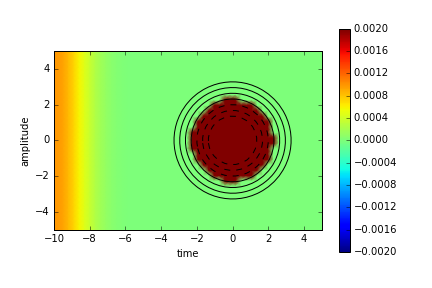
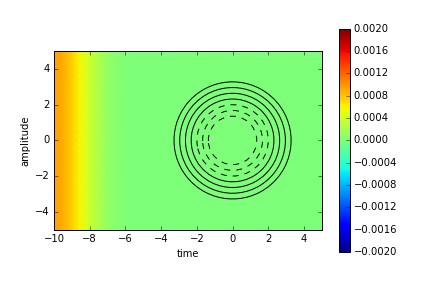
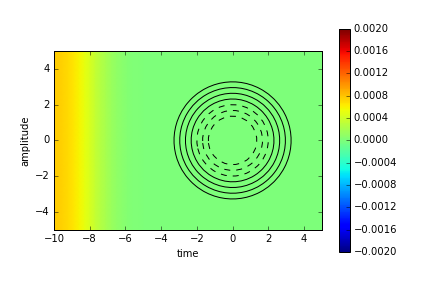
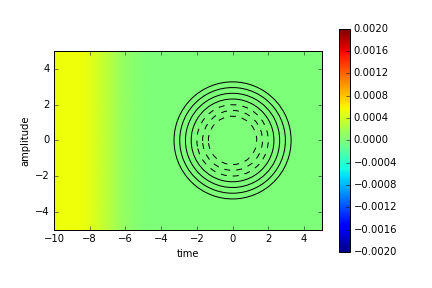
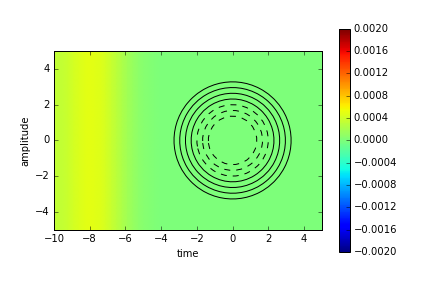
...
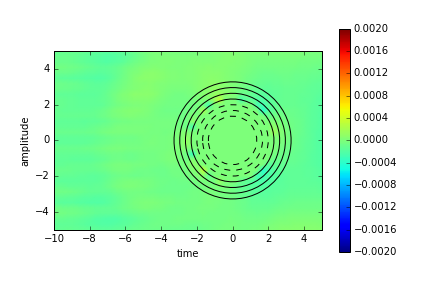
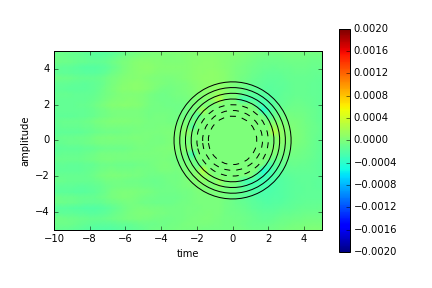
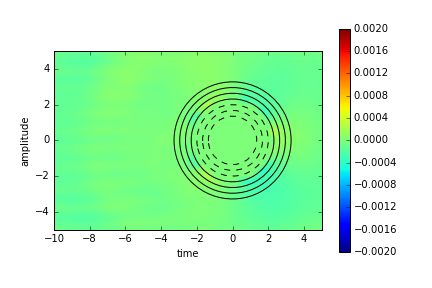
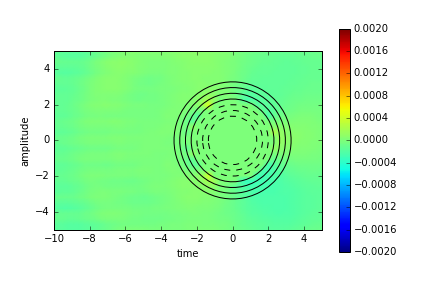
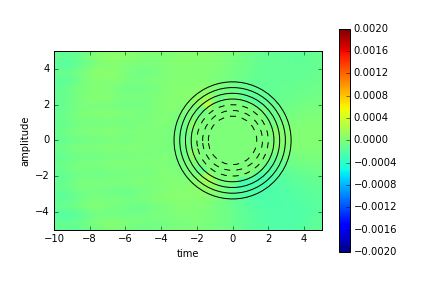

In [72]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmin=-0.002,vmax=0.002)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
ax2.set_xlim(-10,5)
ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*4,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=50, interval=100)

Falla el borde $j=ny$ y $i=0$

# Caso 3: Tsunami Chile 2010

In [74]:
from scipy.io import loadmat

In [75]:
h = loadmat('MorenoCS_h')
falla = loadmat('MorenoCS_z')

In [76]:
xb = h['xh'][0,0][0,:]
yb = h['yh'][0,0][0,:]
zb = h['zh'][0,0]
zf = falla['zf'][0,0]
xf = falla['xf'][0,0][0,:]
yf = falla['yf'][0,0][0,:]

(72,) (99,) (99, 72)


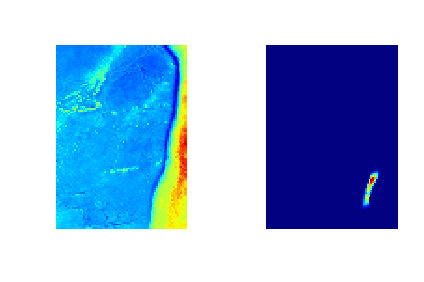

In [77]:
# plt.figure(figsize=(9,9))
r = 6
print xb[::r].shape,yb[::r].shape,zb[::r,::r].shape
plt.subplot(121)
plt.pcolormesh(xb[::r],yb[::r],zb[::r,::r],vmin=-8000,vmax=6000)
plt.axis('equal')
plt.axis('off')
plt.subplot(122)
plt.pcolormesh(xf[::r],yf[::r],zf[::r,::r],vmin=0.0)
plt.axis('off')
plt.axis('equal')
plt.tight_layout()

144 198


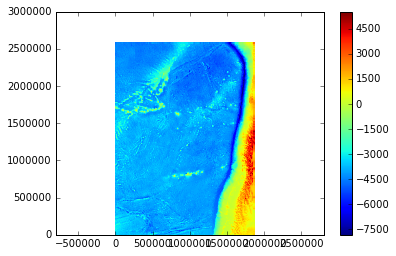

In [248]:
r = 3
nt = 500
x = xb[::r] - xb.min()
y = yb[::r] - yb.min()
x,y = np.meshgrid(x,y,indexing='ij')
h = -zb[::r,::r].T

nx,ny = x.shape
plt.pcolormesh(x,y,-h)
plt.axis('equal')
plt.colorbar()
print nx,ny

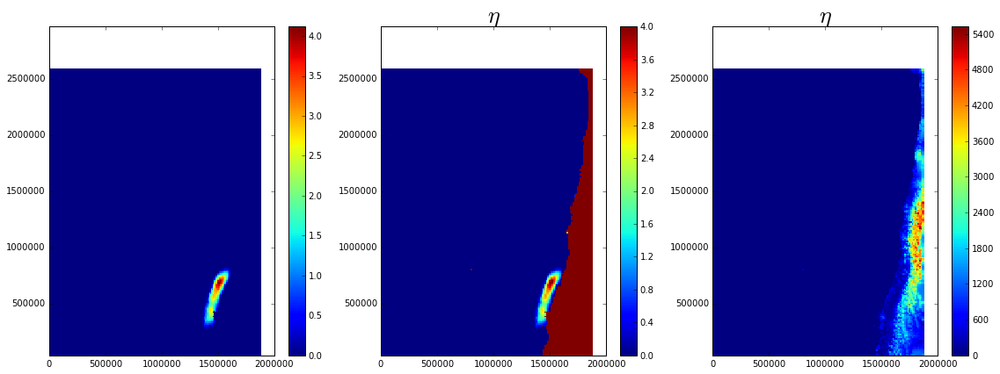

In [249]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = zf[::r,::r].T
eta[0,:,:] = np.where(eta[0,:,:]<0,0.0,eta[0,:,:])
eta[0,:,:] = np.where(h>gx,eta[0,:,:],-h)

plt.figure(figsize=(16,6))
plt.subplot(131)
plt.pcolormesh(x,y,zf[::r,::r].T,vmin=0.0)
plt.colorbar()
plt.axis('equal')
plt.subplot(132)
plt.pcolormesh(x,y,eta[0,:,:],vmax=4)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()
plt.subplot(133)
plt.pcolormesh(x,y,eta[0,:,:])
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()
plt.tight_layout()

In [250]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-2
grx = 9.81*dt/dx
gry = 9.81*dt/dy

In [251]:
np.max(h)

7826.8102311375733

In [259]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)
print 'finished!'

0.0 elapsed: 0.504 s, estimated 252.019 s:
0.002 elapsed: 1.016 s, estimated 253.880 s:
0.004 elapsed: 1.509 s, estimated 251.424 s:
0.006 elapsed: 1.783 s, estimated 222.903 s:
0.008 elapsed: 2.063 s, estimated 206.301 s:
0.01 elapsed: 2.357 s, estimated 196.390 s:
0.012 elapsed: 2.642 s, estimated 188.687 s:
0.014 elapsed: 2.971 s, estimated 185.671 s:
0.016 elapsed: 3.255 s, estimated 180.823 s:
0.018 elapsed: 3.586 s, estimated 179.282 s:
0.02 elapsed: 3.876 s, estimated 176.191 s:
0.022 elapsed: 4.163 s, estimated 173.438 s:
0.024 elapsed: 4.457 s, estimated 171.422 s:
0.026 elapsed: 4.759 s, estimated 169.950 s:
0.028 elapsed: 5.042 s, estimated 168.052 s:
0.03 elapsed: 5.332 s, estimated 166.612 s:
0.032 elapsed: 5.645 s, estimated 166.028 s:
0.034 elapsed: 5.930 s, estimated 164.712 s:
0.036 elapsed: 6.200 s, estimated 163.158 s:
0.038 elapsed: 6.476 s, estimated 161.904 s:
0.04 elapsed: 6.771 s, estimated 161.215 s:
0.042 elapsed: 7.048 s, estimated 160.190 s:
0.044 elapsed: 7

In [254]:
dt

21.310107546298294


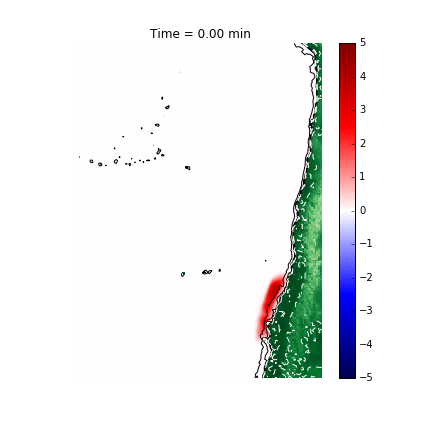
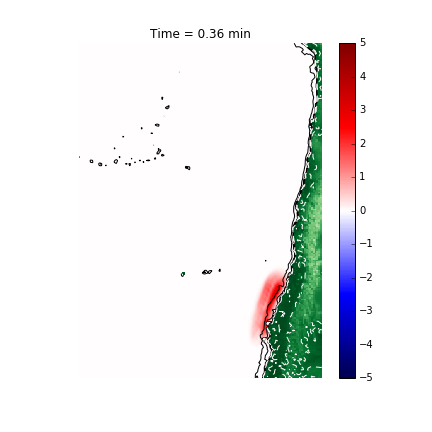
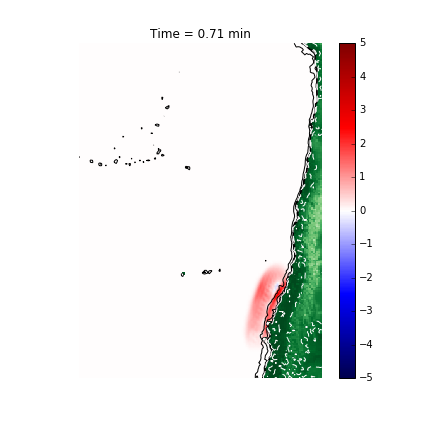
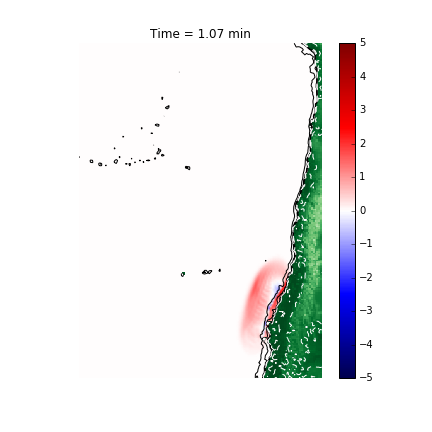
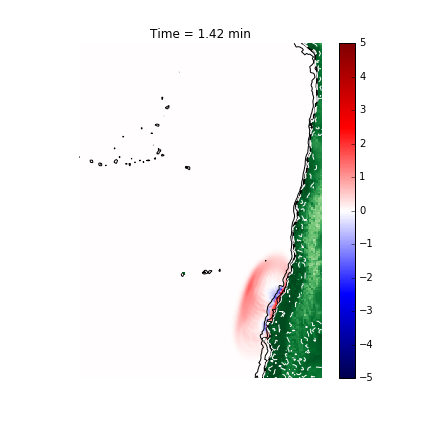
...
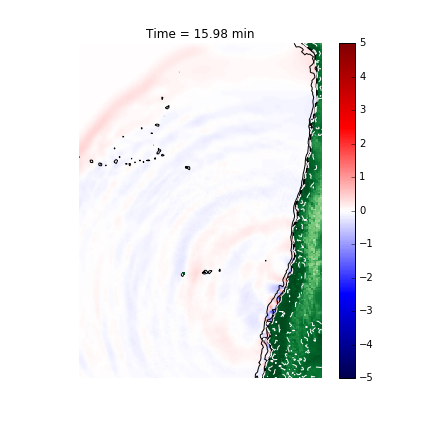
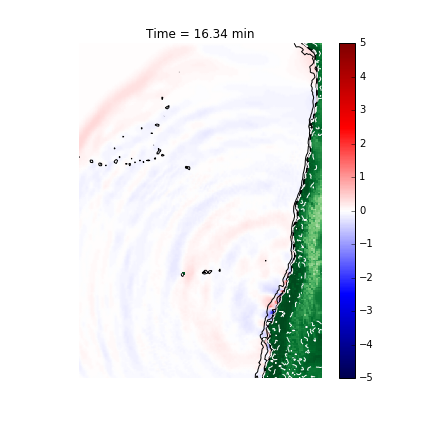
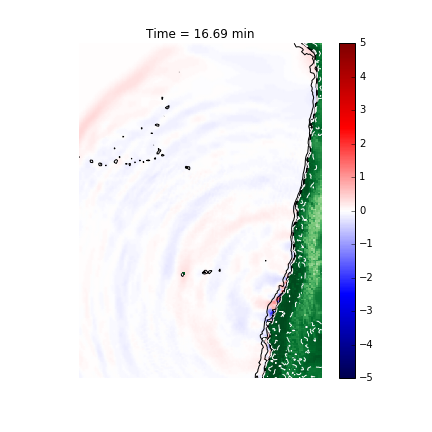
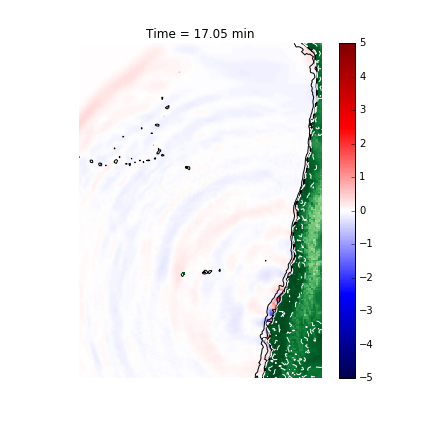
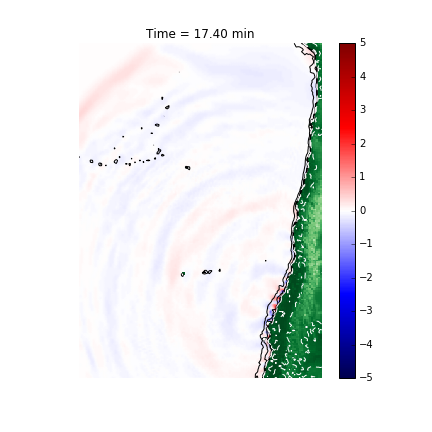

In [260]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure(figsize=(6,6))
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],vmax=5.,vmin=-5.,
                       shading='gouraud',cmap=plt.cm.seismic)
plt.pcolormesh(x,y,np.ma.masked_where(h>0,-h),vmin=0.0,vmax=8000, cmap=plt.cm.Greens_r)
ax2.contour(x,y,h,[0.,10.,100.,1000.],colors='k')
ax2.contour(x,y,h,[-10.,-100.,-1000.],colors='w')
ax2.set_axis_off()
t = ax2.set_title('Time = %.2f min'%(0.0))
# ax2.set_xlim(-10,5)
# ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    t.set_text('Time = %.2f min'%(i*dt/60.))
    quad1.set_array(np.ma.masked_where(h<0,eta[i*10,:,:]).ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=50, interval=100)

Funciona!, hay que revisar el borde superior (refleja), pero ya es aceptable para empezar en la GPU.